* use with branch Xinqiao_branch

## Imports

In [10]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('/home/xz498/needle_4/m3_learning/Auto4DSTEM/src')
sys.path.append('/home/xz498/needle_4/m3_learning/m3_learning/src')
import os

# from colorsys import hls_to_rgb
import numpy as np
import h5py
import matplotlib.pyplot as plt
import matplotlib.patches as patches
# import matplotlib.cm as cm
colors = plt.get_cmap('tab10')
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
from ipywidgets import interact

from scipy.ndimage import shift
# import math
import torch
# import torch.nn as nn
import torch.optim as optim

# from m3_learning.util.nn.Regularization.Regularizers import ContrastiveLoss, DivergenceLoss
from torch.nn import functional as F
# from torch.utils.data import DataLoader
from datetime import date
from tqdm import tqdm

import Auto4DSTEM.src.auto4dstem.nn.CC_ST_AE as CC_ST_AE
from m3_learning.nn.Fitter_AE import spot_fitting as spot
from m3_learning.viz.layout import imagemap, layout_fig
from m3_learning.util.file_IO import make_folder

import datetime
import csv
# import pandas as pd
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
# from pprint import pprint

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
def imshow_tensor(x):
    import matplotlib.pyplot as plt
    plt.imshow(x.detach().cpu().numpy());
    plt.colorbar()
    plt.show()
    
def create_circular_mask(w,h,center,radius1):
    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    # mask = 1 - ( (dist_from_center > radius1) ^ (dist_from_center < radius2) )
    mask = dist_from_center <= radius1
    return mask

def make_colorbar(a):
    ax = a.axes
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="10%", pad=0.05)
    cbar = plt.colorbar(a, cax=cax)

## viz

In [102]:
with h5py.File('Needle4_T20.h5','a') as h1:
    data = h1['processed'][:]
    min_, max_ = data.min(), data.max()
def f(x,y):
    fig, ax = plt.subplots(2)
    a = ax[0].imshow(data[x*128+y],vmin=min_,vmax=max_)
    make_colorbar(a)
    
    a = ax[1].imshow(data.mean(axis=(1,2)).reshape(128,128))
    make_colorbar(a)
    ax[1].plot(x,y,'r.')
        
interact(f,x=(0,128-1),y=(0,128-1))

interactive(children=(IntSlider(value=63, description='x', max=127), IntSlider(value=63, description='y', max=…

<function __main__.f(x, y)>

<HDF5 file "Needle4_T20.h5" (mode r+)>
<KeysViewHDF5 ['denoised', 'processed', 'raw']>


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7244d2ce4f50>>
Traceback (most recent call last):
  File "/home/xinqiao/anaconda3/envs/auto4dstem/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


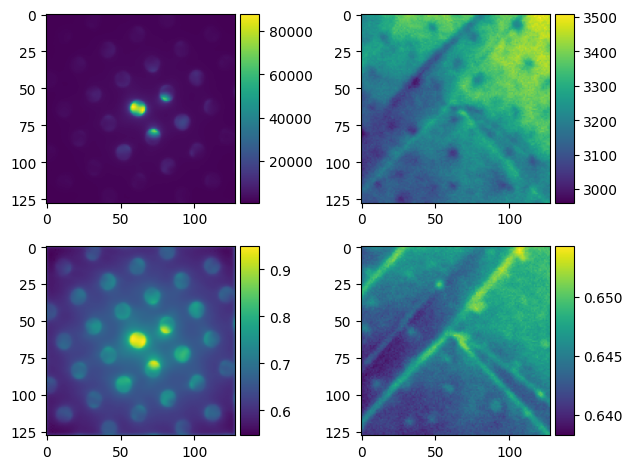

In [99]:
fig, ax = plt.subplots(2,2)
ax = ax.flatten()


with h5py.File('Needle4_T20.h5','a') as h1:
    print(h1)
    print(h1.keys())
    
    a = ax[0].imshow(h1['raw'][:].mean(axis=0))
    make_colorbar(a)
    
    a = ax[1].imshow(h1['raw'][:].mean(axis=(1,2)).reshape(128,128))
    make_colorbar(a)
    
    # Preprocessing: center central beam, take log10, standard scaler, minmax scaler
    a = ax[2].imshow(h1['processed'][:].mean(axis=0))
    make_colorbar(a)
    
    a = ax[3].imshow(h1['processed'][:].mean(axis=(1,2)).reshape(128,128))
    make_colorbar(a)
    
    fig.tight_layout()
    
    test = h1['processed'][:]

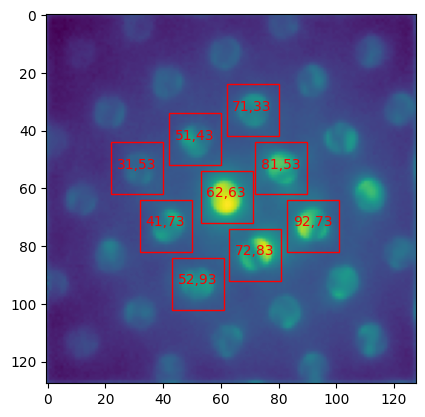

In [103]:
with h5py.File('Needle4.h5','a') as h:
    log_data = h['processed_data']    
    tile_data = h['tile_data']
    
    fig, ax = plt.subplots()
    ax.imshow(log_data[100000:100200].mean(0))
tiles=[(63, 62), 
                    (53,31),(43,51),(33,71),  
                    (53,81),(73,92),(83,72),  
                    (93,52),(73,41)]
for tile in tiles:
    y,x = tile
    r=9
    ax.text(x-7,y, f'{x},{y}', color='r')
    square = patches.Rectangle((x-r,y-r), r*2, r*2, edgecolor='r', facecolor="none")
    ax.add_patch(square)

In [104]:
# spot.write_tiles(h5_filepath='Needle4.h5', orig_dset_name='processed_data', tile_dset_name='tile_data',
#                  coords=tiles, r=9)

In [105]:
# find where the spots are
import  matplotlib.patches as patches
import matplotlib.pyplot as plt
from ipywidgets import interact

def f(t,i):
    
    # print(f'({x},{y})')
    with h5py.File('Needle4.h5','a') as h:
        log_data = h['processed_data']
        tile_data = h['tile_data']
        
        r=tile_data.attrs['r']
        # tile_data.attrs['orig_size'] = orig_size
        x,y = tile_data.attrs['coords'][t]
        
        fig, ax = plt.subplots(1,2)
        ax[0].imshow(log_data[i])
        square = patches.Rectangle((x-r,y-r), r*2, r*2, edgecolor='r', facecolor="none")
        ax[0].add_patch(square)
        ax[1].imshow(tile_data[t,i])
    

# interact(f, x=(0,127), y=(0,127))
interact(f,t=(0,20),i=(0,262143))

interactive(children=(IntSlider(value=10, description='t', max=20), IntSlider(value=131071, description='i', m…

<function __main__.f(t, i)>

## Utils

In [106]:

from torch.autograd import Variable

class PV_CC_ST_AE_utils():
    
    def __init__(self, dset, device='cuda:0',batch_size=32):    # TODO: add more hyperparams
        self.dset = dset 
        self.seed = 12
        self.device = 'cuda:0'
        self.temps_list = [20, 30, 50, 80, 100, 120, 130, 140, 150, 140, 120, 100, 80, 50, 30, 20] # C
        self.file_names = ['20deg',
                        '30deg',
                        '50deg',
                        '80deg',
                        '100deg',
                        '120deg',
                        '130deg',
                        '140deg',
                        '150deg',
                        'T_140Crampdown',
                        'T_120Crampdown',
                        'T_100Crampdown',
                        'T_80Crampdown',
                        'T_30C_rampdown',
                        'T_50Crampdown',
                        'T_20C_rampdown']
        self.path_list = [f'./EMPAD/{file}/scan_x128_y128.raw' for file in self.file_names]
        self.tile_coords = [(63, 62), 
                    (53,31),(43,51),(33,71),  
                    (53,81),(73,92),(83,72),  
                    (93,52),(73,41)]

        self.orig_shape = (128,128,128,128)
        self.interp_size = (128,128,256,256)
        self.r = 10
        self.masking = True
        self.lr = 3e-5
        self.batch_size=batch_size
        
        # PV stuff
        self.pv_fit_channels = 128
        self.pv_enc_channels = 128
        self.pv_ln_coef = 0.01
        self.pv_embedding_size = 10 #(A_g, x0, y0, sx, sy,  A_l, gx, gy, theta, eta)
        self.pv_limits = (0.5, self.r*2, self.r*2, self.r*2, self.r*2,  # A_g, x0, y0, sx, sy,
                          0.5, self.r*2, self.r*2, torch.pi/2) # A_l, gx, gy, theta
        self.fitter_function=spot.generate_pseudovoigt
        self.masking='circle' # options: 'circle', 'square', 'threshold'
        
        # CCSTAE stuff
        self.st_pool_list = [4,4,2]
        self.embedding_size = len(self.dset.tile_coords*2)
        self.reg_coef = 0
        self.scale_coef = 0
        self.shear_coef = 0
        self.norm_order = 1
        self.scale_penalty = 0.04
        self.shear_penalty = 0.03
        self.mask_list = None
        self.batch_para = 1
        self.weighted_mse = True
        self.weight_coef = 2
        self.upgrid_img = False
        self.soft_threshold = 1.5
        self.hard_threshold = 3
        self.con_div = 15
        
        # Training stuff
        self.start_epoch = 0
        self.primary_loss_function = spot.HigherOrderLoss(order=2)
        self.ln_loss_function = spot.LN_loss(ln_parm=2)
        self.mask_thresh = 1e-2
        self.num_pxs = 25

    def compile_model(self):
        self.pv_encoder, self.pv_model = spot.make_models( 
                                    enc_channels=self.pv_fit_channels,
                                    filter_channels=self.pv_enc_channels, 
                                    kernel_size = self.r*2,
                                    embedding_size=self.pv_embedding_size, 
                                    device=self.device,
                                    lr=self.lr, 
                                    limits=self.pv_limits,
                                    masking=self.masking)
        #TODO: put in the hyperparams
        self.encoder = CC_ST_AE.Encoder(original_step_size=[self.orig_shape[-2],self.orig_shape[-1]],
                                    pool_list=self.st_pool_list,
                                    conv_size=128,
                                    device=self.device,
                                    rotation=False,
                                    rotate_clockwise=False,
                                    translation=False,
                                    interpolate=True,
                                    up_size=256,
                                    reduced_size=18, # number of spots*2
                                    num_base=18, # number of spots*2
                                    emb_function='spots',
                                    coords=self.tile_coords,
                                    r=self.r
                                    ).to(self.device)

        self.pv_cc_st_ae = CC_ST_AE.PV_Joint(pv_model=self.pv_model, 
                                        coords=self.tile_coords,
                                        r=self.r,
                                        orig_size=self.orig_shape,
                                        encoder=self.encoder,
                                        decoder=None,
                                        device=self.device,
                                        interp_size=self.interp_size,
                                        masking=self.masking).to(self.device)

        self.optimizer = optim.Adam(self.pv_cc_st_ae.parameters(), lr=self.lr)

    def load_weights(self,path_checkpoint,return_checkpoint=False,embedding_h5_filepath=''):
        """loads the weights from a checkpoint

        Args:
            path_checkpoint (str): path where checkpoints are saved 
            return_checkpoint (bool, Optional): whether to return the checkpoint loaded. Default False
            embedding_h5_filepath (string, Optional): name of the embedding h5 file with checkpoints written in
        
        Returns:
            checkpoint (Optional)
        """
        self.checkpoint = torch.load(path_checkpoint)  
        self.path_checkpoint = path_checkpoint
        self.pv_cc_st_ae.load_state_dict(self.checkpoint["pv_cc_st_ae"])
        self.optimizer.load_state_dict(self.checkpoint['optimizer'])
        self.pv_encoder.load_state_dict(self.checkpoint['pv_encoder'])
        self.pv_model.load_state_dict(self.checkpoint['pv_model'])
        self.encoder.load_state_dict(self.checkpoint["encoder"])
        self.epoch = self.checkpoint["epoch"]+1
        self.loss_dict = self.checkpoint['loss_dict']
        self.checkpoint_name = self.path_checkpoint.split('/')[-1].split('.pkl')[0] 
        self.primary_loss_function.load_state_dict(self.checkpoint['loss_function']),
        self.ln_loss_function.load_state_dict(self.checkpoint['ln_loss_function']),
        self.mask_thresh = self.checkpoint['mask_thresh']
        self.csv_file_path = f'{os.path.split(self.path_checkpoint)[0]}/training_losses.csv'
    
    def Train(self,mask_thresh=0.01,i=25, masking=True,
                pv_loss_order=1, pv_ln_coef=0, pv_ln_parm=2,
                reg_coef=0.,soft_threshold=0.1,norm_order=2,
                max_learning_rate=1e-4,
                seed=12,
                epochs=100,
                with_scheduler=True,
                ln_parm=1,
                folder_path='./pc_cc_st_ae/',
                best_train_loss=None,
                loss_order_scheduler = lambda x: x//20+1,
              ln_coef_scheduler = lambda x: 5e-4*(x//15),
              ln_parm_scheduler = lambda x: 2/(x//10+1),
              lr_scheduler = lambda x: 3e-4/(x//5+1) ):
    
        dataloader = torch.utils.data.DataLoader(self.dset, batch_size=self.batch_size, shuffle=True)
    
        make_folder(folder_path)
        self.csv_file_path = f'{folder_path}/training_losses.csv'

        # set seed
        torch.manual_seed(self.seed)

        # set the number of epochs
        N_EPOCHS = epochs

        # initializes the best train loss
        if best_train_loss == None: best_train_loss = float('inf')

        # get datetime for saving
        today = datetime.datetime.now()
        date = today.strftime('(%Y-%m-%d, %H:%M)')
        
        # training loop
        for epoch in range(self.start_epoch, N_EPOCHS):
            self.primary_loss_function = spot.HigherOrderLoss(order = loss_order_scheduler(epoch))
            self.optimizer = torch.optim.Adam(self.pv_cc_st_ae.parameters(), lr=lr_scheduler(epoch))
            self.ln_loss_function = spot.LN_loss(ln_parm=ln_parm_scheduler(epoch))
            
            loss_dict = self.loss_function(dataloader, 
                                            reg_coef=0.,
                                            norm_order=norm_order )
            
            print(f'Epoch: {epoch:03d}/{N_EPOCHS:03d} | Train Loss: {loss_dict['train_loss']:.2e}')
            print('.............................')
            date = today.strftime('(%Y-%m-%d, %H:%M)')

            # if with_scheduler: schedular.step()
            if best_train_loss > loss_dict['train_loss']:
                best_train_loss = loss_dict['train_loss']
                
            checkpoint = {
                "pv_cc_st_ae": self.pv_cc_st_ae.state_dict(),
                'optimizer': self.optimizer.state_dict(),
                'pv_encoder': self.pv_encoder.state_dict(), 
                'pv_model': self.pv_model.state_dict(),
                "encoder": self.encoder.state_dict(),
                "epoch": epoch,
                'loss_dict': loss_dict,
                'loss_function': self.primary_loss_function.state_dict(),
                'ln_loss_function': self.ln_loss_function.state_dict(),
                "mask_thresh": self.mask_thresh,
                'loss': loss_dict,
                }
            
            if epoch >= 0:
                # lr_ = format(optimizer.param_groups[0]['lr'], '.5f')
                file_path = folder_path + '/Weight_' + date +\
                    f'epoch:{epoch:04d}_lr:'+\
                    f'_trainloss:{loss_dict["train_loss"]:.2e}.pkl'
                torch.save(checkpoint, file_path)
                
                self.write_loss_csv(self.csv_file_path,epoch,loss_dict)

    def loss_function(self,dataloader,mask_thresh=0.01,i=25,masking=True,
                        pv_ln_coef=0,
                        reg_coef=0.,soft_threshold=0.1,norm_order=2):
        # set the train mode
        self.pv_cc_st_ae.train()
        pv_loss=0
        pv_ln_loss=0
        train_loss = 0
        L2_loss = 0
        Scale_Loss = 0
        Shear_Loss = 0
        
        for i,data in enumerate(tqdm(dataloader)):
            loss_=0
            x,tiles = data
            self.optimizer.zero_grad()
            
            # run model
            (   affine_base,
                ae_base,
                predicted_input,
                ae_coords,
                scaler_shear,
                rotation,
                translation,
                adj_mask,
                raw_masks,
                base_masks,
                x_inp, 
            ), (
                g_embedding, 
                g_pred,
                mask_loss, 
                mask_thresh, 
            num_pxs) = self.pv_cc_st_ae(data)

            loss_ = mask_loss
            
            
            # PV LN loss
            if self.pv_ln_coef>0: 
                pv_ln = self.ln_loss_function(g_embedding[:,:,0],self.pv_ln_coef)
                loss_+=pv_ln
                pv_ln += pv_ln.item()
                
            # CCAEST
            
            # calculate l norm from generated base 
            if reg_coef>0: 
                l2_loss = (reg_coef*torch.norm(ae_base.squeeze(), p=norm_order) / x.shape[0])
                loss_ += l2_loss
                L2_loss += l2_loss.item()
            
            # calculate scale penalty
            scale_loss = self.scale_coef * (
                torch.mean(F.relu(abs(scaler_shear[:, 0, 0] - 1) - self.scale_penalty))
                + torch.mean(F.relu(abs(scaler_shear[:, 1, 1] - 1) - self.scale_penalty)))
            
            # calculate shear penalty
            shear_loss = self.shear_coef * torch.mean(
                F.relu(abs(scaler_shear[:, 0, 1]) - self.shear_penalty))
            
            # add l norm, scale penalty and shear penalty to loss 
            loss_ += (scale_loss + shear_loss)
            
            # calculate MSE. DEAL LATER with multiple bases
            # intersect = torch.argwhere( new_list[0] + old_list-1 )
            # b_,x_,y_ = intersect.T
            mask = torch.argwhere( base_masks )
            raw =  torch.argwhere( raw_masks )
            b_,x_,y_ = mask.T
            b__, x__,y__ = raw.T
            mask_factor = len(b_)/(base_masks[0].shape[-2]*base_masks[0].shape[-1])
            loss_ = loss_ + F.mse_loss(  # compare base prediction
                    ae_base[b_,:,x_,y_],
                    affine_base[b_,:,x_,y_],
                reduction="mean") + F.mse_loss( # compare recon and input
                    predicted_input[b__,:,x__,y__],
                    x_inp[b__,:,x__,y__],
                reduction="mean")

            if loss_ > soft_threshold: # For keeping loss on same oom to not have to change lr? 
                # loss += 0 
                loss_ += F.l1_loss( # compare base prediction
                    ae_base[b_,:,x_,y_],
                    affine_base[b_,:,x_,y_],
                reduction="mean") + F.l1_loss( # compare recon and input
                    predicted_input[b__,:,x__,y__],
                    x_inp[b__,:,x__,y__],
                reduction="mean")

            train_loss += loss_.item()/mask_factor            
            pv_loss += mask_loss.item()
            Scale_Loss += scale_loss.item()
            Shear_Loss += shear_loss.item()
            
            loss_.backward()
            self.optimizer.step() 

        loss_dict = {"train_loss": train_loss / len(dataloader),
                     'mask_loss': pv_loss/len(dataloader),
                    'pv_ln_loss': ( pv_ln_loss/len(dataloader) ),
                    "l2_loss": L2_loss / len(dataloader),
                    "scale_loss": Scale_Loss / len(dataloader),
                    "shear_loss": Shear_Loss / len(dataloader),}
        
        print('masked pixels:', i)   
        return loss_dict
    
    def write_loss_csv(self,csv_file_path,epoch,loss_dict):
        if epoch==0:
            with open(csv_file_path, 'w', newline='') as file:
                writer = csv.DictWriter(file,fieldnames=list(loss_dict.keys())+['epoch'])
                writer.writeheader()
        
        with open(csv_file_path, 'a', newline='') as file:    
            loss_dict.update({'epoch': epoch})
            writer = csv.DictWriter(file, fieldnames=loss_dict.keys())
            writer.writerow(loss_dict)
        
    def check_emb_h5(self,length,folder_path='./pc_cc_st_ae_embedding/',emb_h5_filename='embeddings.h5',verbose=True):        
        make_folder(folder_path)
        self.emb_h5_path = f'{folder_path}/{emb_h5_filename}'

        try: h = h5py.File(self.emb_h5_path,'r+')
        except: h = h5py.File(self.emb_h5_path,'w')
        
        try: h.create_dataset(f'embedding_{self.checkpoint_name}',data = np.zeros([length,
                                                                                   self.embedding_size]))
        except: pass 
        try: h.create_dataset(f'scaleshear_{self.checkpoint_name}',data = np.zeros([length,6]))
        except: pass
        try: h.create_dataset(f'rotation_{self.checkpoint_name}',data = np.zeros([length,6]))
        except: pass
        try: h.create_dataset(f'translation_{self.checkpoint_name}',data = np.zeros([length,6]))
        except: pass        
        # try: h.create_dataset(f'pv_embedding_{self.checkpoint_name}',data = np.zeros([length,
        #                                                                               len(self.tile_coords),
        #                                                                             self.pv_fit_channels,
        #                                                                             self.pv_embedding_size]))
        # except: pass
        
        if verbose: [print(key) for key in h.keys()]
        
        h.flush()
        h.close()

    def get_embeddings(self,folder_path='./pc_cc_st_ae_embedding/',emb_h5_filename='embeddings.h5'):
            dataloader = torch.utils.data.DataLoader(self.dset, batch_size=self.batch_size, shuffle=False)
        
            self.check_emb_h5(len(self.dset),folder_path,emb_h5_filename)
            
            with h5py.File(self.emb_h5_path,'r+') as h:
                embedding_ = h[f'embedding_{self.checkpoint_name}']
                scale_shear_ = h[f'scaleshear_{self.checkpoint_name}']
                rotation_ = h[f'rotation_{self.checkpoint_name}'] 
                translation_ = h[f'translation_{self.checkpoint_name}']
                pv_embedding_ = h[f'pv_embedding_{self.checkpoint_name}']
                
                for i,x in enumerate(tqdm(dataloader, leave=True, total=len(dataloader))):
                    full, tiles=x
                    with torch.no_grad():
                        test_values = [Variable(full.to(self.device)).float(), 
                                    Variable(tiles.to(self.device)).float() ]
                        (   affine_base,
                            ae_base,
                            predicted_input,
                            ae_coords,
                            scaler_shear,
                            rotation,
                            translation,
                            adj_mask,
                            raw_masks,
                            base_masks,
                            x_inp, 
                        ), (
                            pv_embedding, #[b_*s_, ch, numpar]
                            pv_pred,
                            mask_loss, 
                            mask_thresh, 
                        num_pxs) = self.pv_cc_st_ae(x)
                        
                        embedding_[(i)*len(full):(i+1)*len(full), :] = ae_coords.reshape(len(full),-1).cpu()
                        scale_shear_[(i)*len(full):(i+1)*len(full), :] = scaler_shear.reshape(-1,6).cpu().detach().numpy()
                        rotation_[(i)*len(full):(i+1)*len(full), :] = rotation.reshape(-1,6).cpu().detach().numpy()
                        translation_[(i)*len(full):(i+1)*len(full), :] = translation.reshape(-1,6).cpu().detach().numpy()
                        # pv_embedding_[(i)*len(full):(i+1)*len(full)] = pv_embedding.reshape(len(full),len(self.tile_coords),
                                                                                            # -1,self.pv_embedding_size).cpu().detach().numpy()
                    
                    
                    h.flush()
            h.close()

## Training

In [10]:
tile_coords = [(63, 62), 
                    (53,31),(43,51),(33,71),  
                    (53,81),(73,92),(83,72),  
                    (93,52),(73,41)] 
r = 10

In [11]:
dset = spot.tile_dataset(tile_coords, r, 
                 h5_file_path='Needle4_T20.h5', h5_dset_name='processed', 
                 device='cuda:0',)

model = PV_CC_ST_AE_utils(dset,batch_size=16)
model.compile_model()
# model.load_weights('./pc_cc_st_ae/Weight_(2024-05-28, 20:15)epoch:0001_lr:_trainloss:2.48e-03.pkl'
                   
#                    )

In [12]:
model.Train(epochs=50, 
            folder_path='./pc_cc_st_ae_l1/',
            loss_order_scheduler = lambda x: 2,
            ln_coef_scheduler = lambda x: 5e-2*(x/15),
            ln_parm_scheduler = lambda x: 2/(x/50+1),
            lr_scheduler = lambda x: 3e-5 )

100%|██████████| 1024/1024 [09:38<00:00,  1.77it/s]


masked pixels: 1023
Epoch: 000/050 | Train Loss: 5.32e-01
.............................


  0%|          | 4/1024 [00:02<10:30,  1.62it/s]


ValueError: too many values to unpack (expected 2)

In [8]:
debug

> /tmp/ipykernel_4026910/3159571477.py(314)loss_function()
    312 
    313         loss_dict = {"train_loss": train_loss / len(dataloader),
--> 314                      'mask_loss': primary_loss/len(dataloader),
    315                     'pv_ln_loss': ( pv_ln_loss/len(dataloader) ),
    316                     "l2_loss": L2_loss / len(dataloader),



## viz training

In [107]:
checkpoint = './pc_cc_st_ae_l1/Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01.pkl'               
 

model.load_weights(checkpoint )
dataloader = torch.utils.data.DataLoader(model.dset, batch_size=model.batch_size, shuffle=False)
batch = next(iter(dataloader))

(   affine_base,
    ae_base,
    predicted_input,
    ae_coords,
    scaler_shear,
    rotation,
    translation,
    adj_mask,
    raw_masks,
    base_masks,
    x_inp, 
), (
    pv_embedding, 
    pv_pred,
    mask_loss, 
    mask_thresh, 
num_pxs) = model.pv_cc_st_ae(batch)

In [110]:
from ipywidgets import interact
from m3_learning.viz.layout import imagemap

def f(i,save_path='',save_format='svg',**kwargs):
    fig, ax = plt.subplots(2,2,figsize=(8,8))
    ax=ax.flatten()

    imagemap(ax[0],(x_inp[i,0]).detach().cpu(),**kwargs) # interp this or interp predicted_revise for mse loss?
    imagemap(ax[1],(predicted_input[i,0]*raw_masks[i]).detach().cpu(),**kwargs) 
    imagemap(ax[2],(ae_base[i,0]*base_masks[i]).detach().cpu(),**kwargs)
    imagemap(ax[3],(affine_base[i,0]*base_masks[i]).detach().cpu(),**kwargs)
    # imagemap(ax[4],sum(new_list)[i].detach().cpu())
    # imagemap(ax[5],spots.detach().cpu()[0]*sum(new_list).detach().cpu()[i])

    ax[0].set_title('input')
    ax[1].set_title('predicted input (base*inv_theta)')
    ax[2].set_title('predicted base from encoder') # predicted revised- is this supposed to be the unstrained diff pattern?
    ax[3].set_title('predicted base from affine (theta*input)')
    # print(f'k_out: {k_out[i]}')
    # # print(f'adj_mask: {adj_mask[i]}')
    # ax[4].set_title('mask')
    # ax[5].set_title('masked PV fit')
    for j in range(4):
        if j//2==1: spot.plot_bounding_boxes(ax[j], ae_coords[i].detach().cpu(), r, interp_factor=2, linestyle='--', marker='*',legend=True)
        else: spot.plot_bounding_boxes(ax[j], torch.tensor(tile_coords), r, interp_factor=2, linestyle='-')
    fig.tight_layout()
    
    if len(save_path)>0:
        make_folder(f'{save_path}/')
        fig.savefig(f'{save_path}/{i}_batch_result.{save_format}')
    
    
    
# interact(f,i=(0,len(batch[0])-1))

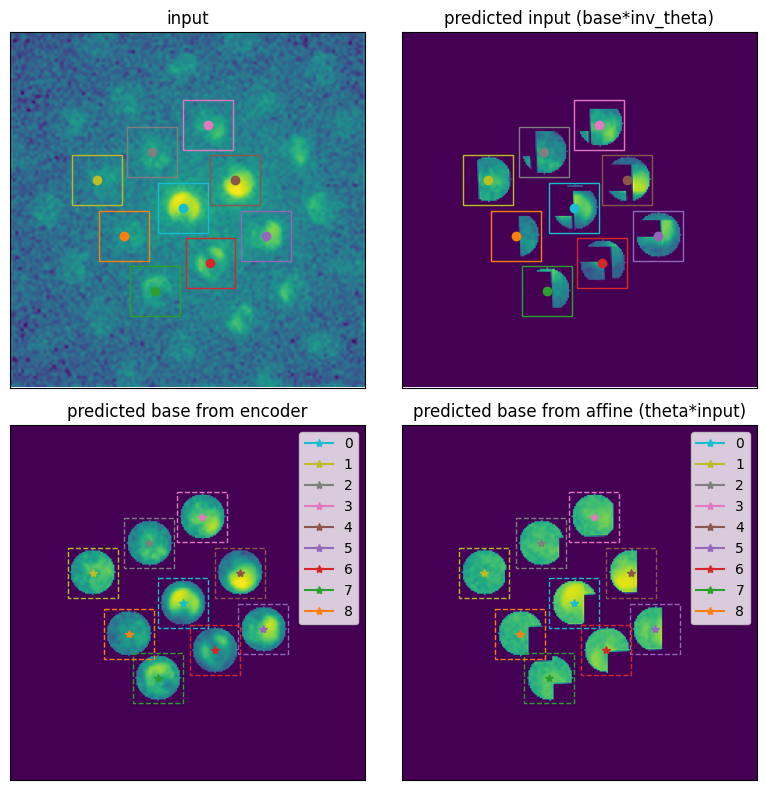

In [111]:
f(0,save_path='./pvccstae_model_figs/',save_format='svg',colorbars=False)

In [8]:
from ipywidgets import interact
from m3_learning.viz.layout import imagemap

def f(i):
    fig, ax = plt.subplots(2,2,figsize=(12,12))
    ax=ax.flatten()

    imagemap(ax[0],(x_inp[i,0]).detach().cpu()) # interp this or interp predicted_revise for mse loss?
    imagemap(ax[1],(predicted_input[i,0]).detach().cpu()) 
    imagemap(ax[2],(ae_base[i,0]).detach().cpu())
    imagemap(ax[3],(affine_base[i,0]).detach().cpu())
    # imagemap(ax[4],sum(new_list)[i].detach().cpu())
    # imagemap(ax[5],spots.detach().cpu()[0]*sum(new_list).detach().cpu()[i])

    ax[0].set_title('input')
    ax[1].set_title('predicted input (enc_base*inv_theta)')
    ax[2].set_title('base (encoder)') # predicted revised- is this supposed to be the unstrained diff pattern?
    ax[3].set_title('base (theta*input)')
    # print(f'k_out: {k_out[i]}')
    # # print(f'adj_mask: {adj_mask[i]}')
    # ax[4].set_title('mask')
    # ax[5].set_title('masked PV fit')
    for j in range(4):
        if j//2==1: spot.plot_bounding_boxes(ax[j], ae_coords[i].detach().cpu(), r, interp_factor=2, linestyle='--', marker='*',legend=True)
        else: spot.plot_bounding_boxes(ax[j], torch.tensor(tile_coords), r, interp_factor=2, linestyle='-')
    
    fig.tight_layout()
    
    
interact(f,i=(0,len(batch[0])-1))

interactive(children=(IntSlider(value=7, description='i', max=15), Output()), _dom_classes=('widget-interact',…

<function __main__.f(i)>

In [95]:
full,tiles = batch
tiles = tiles.reshape(-1,r*2,r*2)
centroids = (ae_coords-model.pv_cc_st_ae.tile_coords)
cy,cx = centroids.reshape(-1,2).T
# centroids.shape: torch.Size([16, 9, 2])

masks = spot.get_circle_mask(model.pv_cc_st_ae.mask_r,cx,cy,
            output_shape=(model.pv_cc_st_ae.r*2,model.pv_cc_st_ae.r*2),
            interp_factor=1,device=model.pv_cc_st_ae.device)
# masks.shape: torch.Size([144, 20, 20])
temp_mask_,mask_loss,mask_thresh,num_pxs = spot.get_mask_loss(tiles,pv_pred,masking='preset',masks=masks)
           
# b_inds.shape: torch.Size([201, 1])
# mask_inds.shape: torch.Size([28909, 3])
[A_g, x0, y0, sx, sy,  A_l, gx, gy, theta, eta] = pv_embedding.swapaxes(1,2).swapaxes(0,1)
# gparms = spot.get_gaussian_parameters(pv_embedding[:,:,:5].transpose(0,1),
#                                 limits=model.pv_limits[:5],
#                                 kernel_size=r*2)
# lparms = spot.get_lorentzian_parameters(pv_embedding[:,:,5:8].transpose(0,1),
#                                 limits=model.pv_limits[5:8],
#                                 kernel_size=r*2)

t_filters = model.pv_model.apply_transforms(pv_embedding.transpose(0,1),
                                           limits=model.pv_limits).detach().cpu().numpy()
res = pv_pred.detach().cpu().numpy()
# avg_mask=Fitter.avg_mask.detach().cpu().numpy()
temp_mask=temp_mask_.reshape(-1,1,r*2,r*2)
clean_mask = model.pv_cc_st_ae.dilate_mask(temp_mask)
clean_mask = model.pv_cc_st_ae.erode_mask(clean_mask,pxs=2)
clean_mask = model.pv_cc_st_ae.dilate_mask(clean_mask).squeeze().detach().cpu().numpy()

min_, max_ = t_filters.min(), t_filters.max()


def f(i,ch,save_path='',save_format='svg',**kwargs): # batch item, channel
    fig = plt.figure(tight_layout=True,figsize=(8,4))
    gs = gridspec.GridSpec(2,4,figure=fig)
    ax = [fig.add_subplot(gs[0,0]), 
          fig.add_subplot(gs[0,1]), 
          fig.add_subplot(gs[1,0]), 
          fig.add_subplot(gs[1,1]),
          fig.add_subplot(gs[:,2:]) ]
    # ax=ax.flatten()
    imagemap(ax[0], tiles.reshape(-1,r*2,r*2)[i].squeeze().detach().cpu().numpy(),**kwargs) # orig image
    ax[0].set_title('Original Image')
    imagemap(ax[1], res[i].squeeze(),**kwargs) # sum of dcts
    ax[1].set_title('Predicted')
    imagemap(ax[2], tiles.reshape(-1,r*2,r*2)[i].squeeze().detach().cpu().numpy()*clean_mask[i],**kwargs) # mask
    ax[2].set_title('mask* original')
    imagemap(ax[3], t_filters[ch,i].squeeze(),**kwargs) # transformed dct filter   
    ax[3].set_title('Layer')
    # imagemap(ax[4],test_data[i//9])
    imagemap(ax[4],full[i//16].detach().cpu().numpy(),**kwargs)
    spot.plot_bounding_boxes(ax[4],tile_coords,r,inds=[i%9])
    ax[4].set_title('original img')
    
    for j in range(4):
        spot.plot_bounding_boxes(ax[j],[(r-.6,r-.6) for c in tile_coords],r,dot=False,linewidth=10,inds=[i%9])
        ax[j].axis("off")
    
    if len(save_path)>0:
        make_folder(f'{save_path}/')
        fig.savefig(f'{save_path}/{i}_{ch}_spots.{save_format}')
     
    print(f'batch {i}:  G amplitude={A_g[ch,i].item():.3f}, mean=({x0[ch,i].item():.3f}, {y0[ch,i].item():.3f}), cov=({sx[ch,i].item():.3f}, {sy[ch,i].item():.3f})')                     
    print(f'L amplitude={A_l[ch,i].item():.3f}, gamma=({gx[ch,i].item():.3f}, {gy[ch,i].item():.3f}),  theta={theta[ch,i].item():.3f},  eta={eta[ch,i].item():.3f}')
#     print('loss order:', Fitter.primary_loss_function.order, 
#           '\tln parm:',Fitter.ln_loss_function.ln_parm,
      #     )
# interact(f,i=(0,t_filters.shape[1]-1),ch=(0,t_filters.shape[0]-1))

batch 0:  G amplitude=-0.121, mean=(0.177, -0.168), cov=(-0.512, 0.595)
L amplitude=0.359, gamma=(-0.433, -0.000),  theta=0.001,  eta=0.068
batch 0:  G amplitude=-0.156, mean=(0.185, -0.184), cov=(-0.556, 0.599)
L amplitude=0.274, gamma=(-0.389, 0.009),  theta=-0.078,  eta=0.014
batch 0:  G amplitude=-0.090, mean=(0.159, -0.123), cov=(-0.533, 0.534)
L amplitude=0.285, gamma=(-0.413, 0.046),  theta=-0.092,  eta=-0.028
batch 0:  G amplitude=-0.101, mean=(0.163, -0.197), cov=(-0.580, 0.592)
L amplitude=0.281, gamma=(-0.424, -0.002),  theta=-0.099,  eta=-0.014
batch 0:  G amplitude=-0.037, mean=(0.142, -0.158), cov=(-0.591, 0.550)
L amplitude=0.292, gamma=(-0.387, 0.020),  theta=-0.105,  eta=-0.004
batch 1:  G amplitude=-0.002, mean=(0.249, -0.243), cov=(-0.679, 0.552)
L amplitude=0.419, gamma=(-0.352, -0.180),  theta=0.081,  eta=0.133
batch 1:  G amplitude=-0.029, mean=(0.191, -0.298), cov=(-0.800, 0.592)
L amplitude=0.423, gamma=(-0.322, -0.292),  theta=0.030,  eta=0.084
batch 1:  G ampl

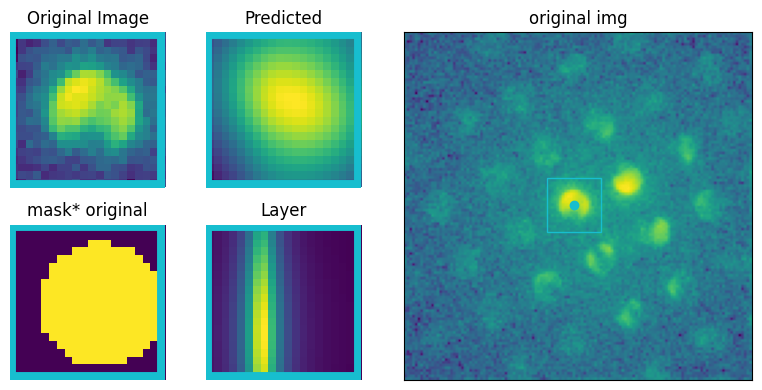

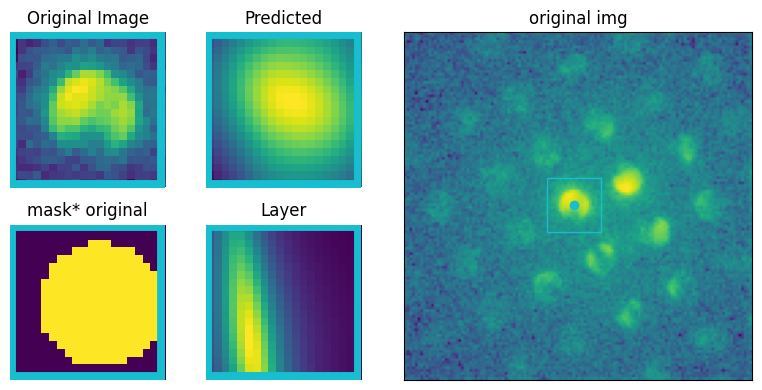

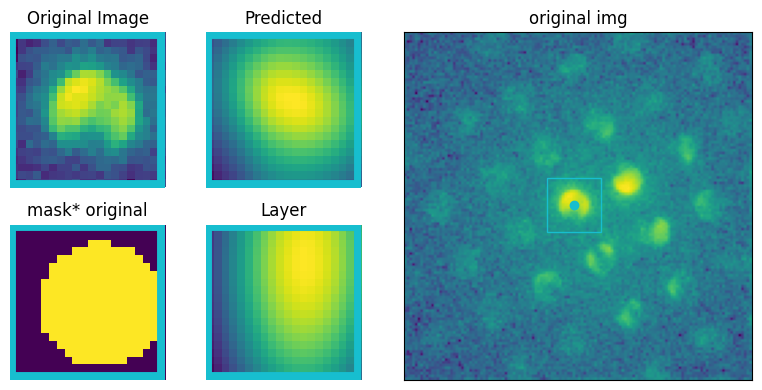

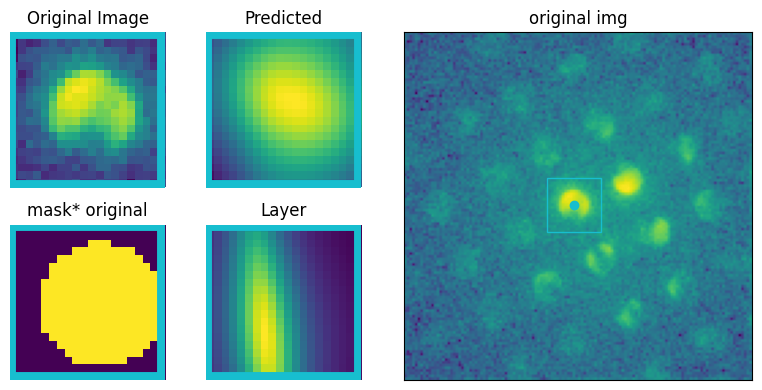

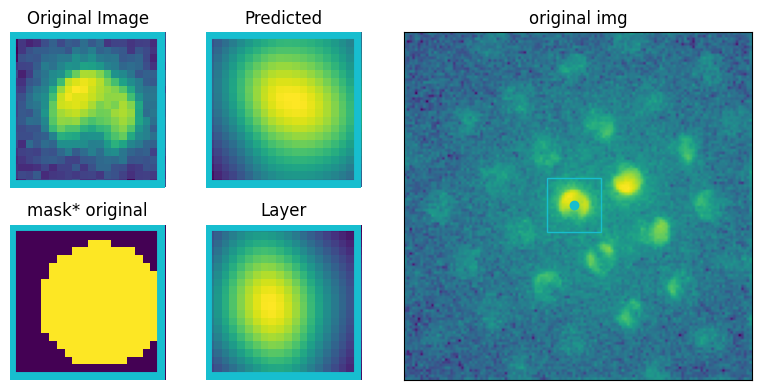

...

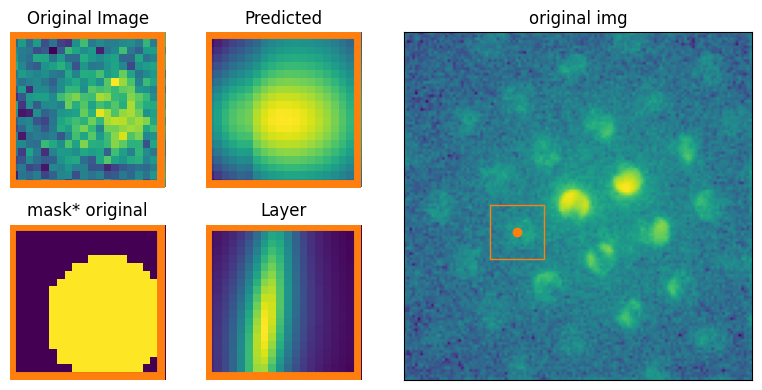

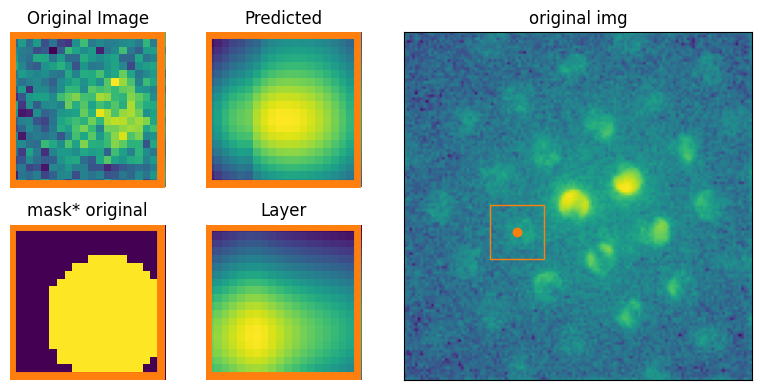

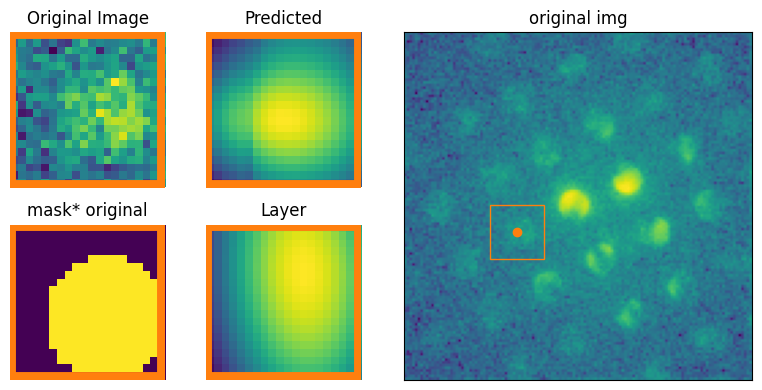

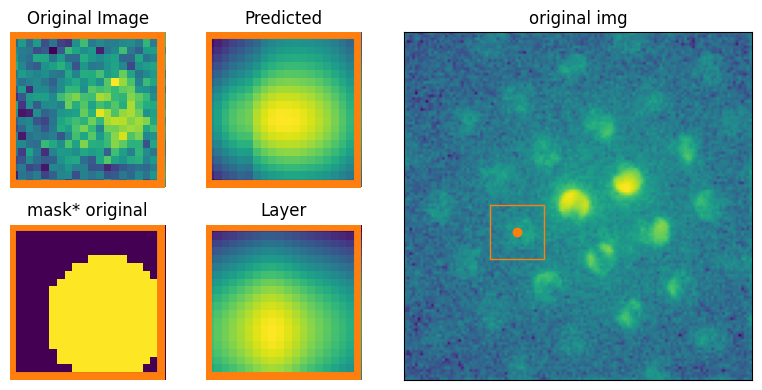

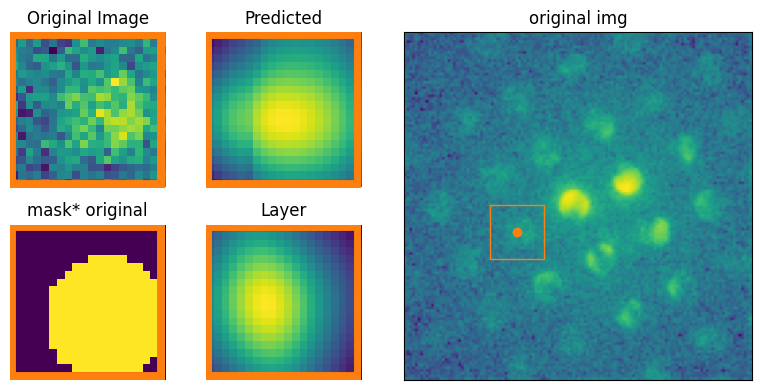

In [94]:
for i in range(9):
    for j in range(5):
        f(i,j,save_path='./pvccstae_model_figs/',save_format='svg',colorbars=False)

## Embeddings

In [15]:
tile_coords = [(63, 62), 
                    (53,31),(43,51),(33,71),  
                    (53,81),(73,92),(83,72),  
                    (93,52),(73,41)] 
r = 10

In [16]:
dset = spot.tile_dataset(tile_coords, r, 
                 h5_file_path='Needle4_T20.h5', h5_dset_name='processed', 
                 device='cuda:0',)

model = PV_CC_ST_AE_utils(dset,batch_size=16)
model.compile_model()
model.load_weights(checkpoint)
model.check_emb_h5(len(dset))

embedding_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01
pv_embedding_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01
rotation_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01
scaleshear_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01
translation_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01


In [84]:
with h5py.File(model.emb_h5_path, 'r+') as h:
    print( h[f'pv_embedding_{model.checkpoint_name}'].shape)
    
    # h.create_dataset(f'pv_embedding_{model.checkpoint_name}',data = np.zeros([len(dset),
    #                                                                                   len(model.tile_coords),
    #                                                                                 model.pv_fit_channels,
    #                                                                                 model.pv_embedding_size]))
        
    print(h.keys())

AttributeError: 'PV_CC_ST_AE_utils' object has no attribute 'checkpoint_name'

In [36]:
model.get_embeddings()

embedding_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01
pv_embedding_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01
rotation_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01
scaleshear_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01
translation_Weight_(2024-06-04, 14:52)epoch:0000_lr:_trainloss:5.32e-01


100%|██████████| 1024/1024 [05:03<00:00,  3.37it/s]


## vis pv embedding

In [17]:
labels = ('A_g', 'x0', 'y0', 'sx', 'sy',  'A_l', 'gx', 'gy', 'theta', 'eta')

In [18]:
t_filters.shape

(128, 144, 20, 20)

In [19]:
def f(spot,ch,pv_parm): # s for spot
    fig,ax = layout_fig(2,2)
    # fig,ax = plt.subplots()
    with h5py.File(model.emb_h5_path, 'r+') as h: # (16384, 9, 128, 10)
        # print( h[f'pv_embedding_{model.checkpoint_name}'].shape)
        imagemap(ax[0],h[f'pv_embedding_{model.checkpoint_name}'][:,spot,ch,pv_parm].reshape(128,128))
        ax[0].set_title(labels[pv_parm])
    imagemap(ax[1], t_filters[ch,spot::16].mean(axis=0)) # transformed dct filter   
    ax[1].set_title(f'filter at spot {spot}')
        
interact(f,spot=(0,8),ch=(0,127),pv_parm=(0,9))

interactive(children=(IntSlider(value=4, description='spot', max=8), IntSlider(value=63, description='ch', max…

<function __main__.f(spot, ch, pv_parm)>

In [24]:
from sklearn.decomposition import PCA, NMF

In [20]:
component_list =[]
sv_list = []
pca = PCA(n_components=11,svd_solver='auto')
for s in tqdm(range(9)):
    with h5py.File(model.emb_h5_path, 'r+') as h:
        data = h[f'pv_embedding_{model.checkpoint_name}'][:,s,:,:]
        pca.fit(data.reshape(128*128,-1).T)
        component_list.append(pca.components_)
        sv_list.append(pca.singular_values_)

100%|██████████| 9/9 [00:04<00:00,  2.05it/s]


In [21]:
def f(s): # s for spot
    fig,axes = plt.subplots(3,4,figsize=(12,8));
    axes=axes.flatten();
    for c in range(11): # c for component
        imagemap(axes[c],component_list[s][c].reshape(128,128).T);
        axes[c].set_title(f'{c}: sv {sv_list[s][c]:.3f}')
    imagemap(axes[-1], tiles[s].squeeze().detach().cpu().numpy()); # orig image
    axes[-1].set_title('Original Image');
    fig.tight_layout();
interact(f,s=(0,8))


interactive(children=(IntSlider(value=4, description='s', max=8), Output()), _dom_classes=('widget-interact',)…

<function __main__.f(s)>

In [67]:
interact(f,s=(0,8))

interactive(children=(IntSlider(value=4, description='s', max=8), Output()), _dom_classes=('widget-interact',)…

<function __main__.f(s)>

## viz emb

In [28]:
def get_theta(rotation):
    """_summary_

    Args:
        rotation (array-like): (n,2,3) affine matrix reshapeed into (n,6)

    Returns:
        float: _description_
    """    
    acos = np.arccos(rotation[:,0])
    asin = np.arcsin(rotation[:,1])
    theta = asin.copy()

    # asin(+), acos(+) means the angle is accurate
    # asin(-), acos(-) means 3rd quadrant
    theta[ np.intersect1d(np.argwhere(acos<0), np.argwhere(asin<0)) ] *= -1 
    theta[ np.intersect1d(np.argwhere(acos<0), np.argwhere(asin<0)) ] += -np.pi
    # asin(+), acos(-) means 2nd quadrant
    theta[ np.intersect1d(np.argwhere(acos<0), np.argwhere(asin>0)) ] *= -1
    theta[ np.intersect1d(np.argwhere(acos<0), np.argwhere(asin>0)) ] += np.pi/2
    
    return theta

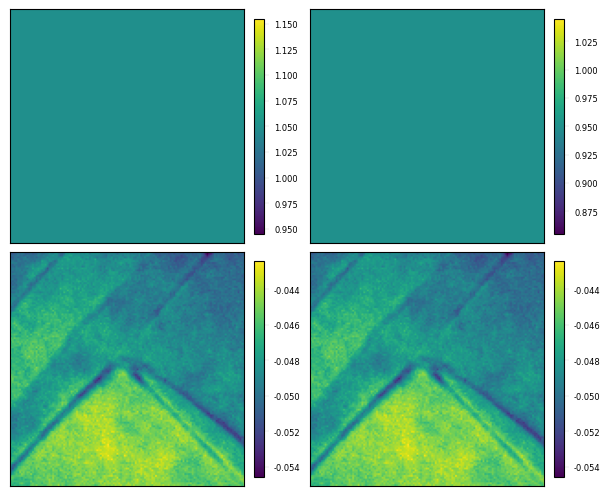

In [38]:
from m3_learning.viz.layout import layout_fig, imagemap
X,Y = model.orig_shape[:2]
# builds the figure
fig, axs = layout_fig(4, mod=2,)

with h5py.File(model.emb_h5_path) as h:
    embedding = h[f'embedding_{model.checkpoint_name}']
    scale_shear = h[f'scaleshear_{model.checkpoint_name}']
    rotation = h[f'rotation_{model.checkpoint_name}'] 
    translation = h[f'translation_{model.checkpoint_name}']
    i=0
    # # translation
    # imagemap(axs[i], translation[:,2].reshape(X,Y), 
    #             divider_=False, ) # scale x
    # imagemap(axs[i+1], translation[:,5].reshape(X,Y), 
    #             divider_=False, ) # scale y
    # i+=2
    # scale_shear
    imagemap(axs[i], scale_shear[:,0].reshape(X,Y), 
                divider_=False, cbar_number_format='%.3f') # scale x
    imagemap(axs[i+1], scale_shear[:,4].reshape(X,Y), 
                divider_=False, cbar_number_format='%.3f') # scale y
    i+=2
    imagemap(axs[i], scale_shear[:,1].reshape(X,Y), 
                divider_=False, cbar_number_format='%.3f') # shear x
    imagemap(axs[i+1], scale_shear[:,3].reshape(X,Y), 
                divider_=False, cbar_number_format='%.3f') # shear y
    i+=2
    # # rotation
    # theta = get_theta(rotation)
    # # lim = abs(theta.mean())+abs(3*theta.std())
    # imagemap(axs[i], theta.reshape(X,Y), 
    #             divider_=False,) # rotation angle

In [39]:
with h5py.File(model.emb_h5_path) as h:
        embedding = h[f'embedding_{model.checkpoint_name}']
        print(embedding[:].max())

91.26944732666016


In [20]:
def f(a,b,t):
    fig = plt.figure(tight_layout=True,figsize=(8,4))
    gs = gridspec.GridSpec(2,3,figure=fig)
    ax = [fig.add_subplot(gs[0,0]), # x emb image
          fig.add_subplot(gs[1,0]), # y emb image
          fig.add_subplot(gs[:,1:]) ] # (a,b) diffraction image (raw img)
    x,y = dset.tile_coords[t]
    r=dset.r
    
    with h5py.File(model.emb_h5_path) as h:
        embedding = h[f'embedding_{model.checkpoint_name}']
        # scale_shear = h[f'scaleshear_{model.checkpoint_name}']
        # rotation = h[f'rotation_{model.checkpoint_name}'] 
        # translation = h[f'translation_{model.checkpoint_name}']
        x_,y_ = embedding[a*128+b,t*2],embedding[a*128+b,t*2+1]    
        imagemap(ax[0], dset.tile_coords[t][0]-embedding[:,t*2], cbar_number_format='%.3f')
        ax[0].plot(a,b,'w*')
        ax[0].set_title(f'x strain')
        imagemap(ax[1], dset.tile_coords[t][1]-embedding[:,t*2+1], cbar_number_format='%.3f')
        ax[1].plot(a,b,'w*')  
        ax[1].set_title(f'y strain')
        
    with h5py.File(dset.h5_file_path) as h:
        dat = h[dset.h5_dset_name]
        imagemap(ax[2], dat[a*128+b], cbar_number_format='%.3f')
    
    # plot orig
    square = patches.Rectangle((y-r,x-r), r*2, r*2, linestyle='-', edgecolor='red', facecolor="none")
    ax[2].add_patch(square)
    ax[2].plot(y,x,marker='.',color='r', label='original')
    # plot pred
    square = patches.Rectangle((y_-r,x_-r), r*2, r*2, linestyle='--', edgecolor='red', facecolor="none")
    ax[2].add_patch(square)
    ax[2].plot(y_,x_,marker='*',color='r', label='basis')
    ax[2].legend()
    ax[2].set_title(f'diffraction at ({a},{b})')
    
interact(f,a=(0,127),b=(0,127),t=(0,8))

interactive(children=(IntSlider(value=63, description='a', max=127), IntSlider(value=63, description='b', max=…

<function __main__.f(a, b, t)>